# LAB 03 - THỰC HÀNH: CÁC GIẢI THUẬT PHÂN CỤM CƠ BẢN

## 3.1. GIẢI THUẬT K-MEANS

### Bài toán 1

#### Nhiệm vụ 1: Thực hiện giải thuật K-Means để phân cụm dữ liệu khách

In [18]:
# Import các gói thư viện và nạp dữ liệu vào notebook
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
plt.rcParams['figure.dpi'] = 400

df = pd.read_csv('Data/Mall_Customers.csv')
# Transform Gender to 0's and 1's
df['Gender'] = df['Gender'].map({'Male': 1, "Female": 0})
df.info()
# Data for cluster
X = df.iloc[:, -4:]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype
---  ------                  --------------  -----
 0   CustomerID              200 non-null    int64
 1   Gender                  200 non-null    int64
 2   Age                     200 non-null    int64
 3   Annual Income (k$)      200 non-null    int64
 4   Spending Score (1-100)  200 non-null    int64
dtypes: int64(5)
memory usage: 7.9 KB


In [2]:
# Xây dựng mô hình K-Means

# We will create K-Means Models `iteratively between k values of 3 to 10` and at each step, capture the `Silhoutte Score` and `Inertia (Sum of Squared Distances)`
km_inertias, km_scores = [], []
for k in range(3, 10):
     km = KMeans(n_clusters=k).fit(X)
     km_inertias.append(km.inertia_)
     km_scores.append(silhouette_score(X, km.labels_))
     print(f"Processing K-Means with k = {k}, Intertia = {km.inertia_}, Silhoutte Score = {silhouette_score(X, km.labels_)}")
km_inertias

Processing K-Means with k = 3, Intertia = 157215.1630732884, Silhoutte Score = 0.31138465257949377
Processing K-Means with k = 4, Intertia = 105299.98742210324, Silhoutte Score = 0.3921703094115865
Processing K-Means with k = 5, Intertia = 75528.58656469134, Silhoutte Score = 0.4402372958247734
Processing K-Means with k = 6, Intertia = 72172.71285322521, Silhoutte Score = 0.4052958036741336
Processing K-Means with k = 7, Intertia = 51575.27793107792, Silhoutte Score = 0.43479758148661335
Processing K-Means with k = 8, Intertia = 48261.33531258531, Silhoutte Score = 0.4221529314840327
Processing K-Means with k = 9, Intertia = 41184.787567878026, Silhoutte Score = 0.3999443750635166


[157215.1630732884,
 105299.98742210324,
 75528.58656469134,
 72172.71285322521,
 51575.27793107792,
 48261.33531258531,
 41184.787567878026]

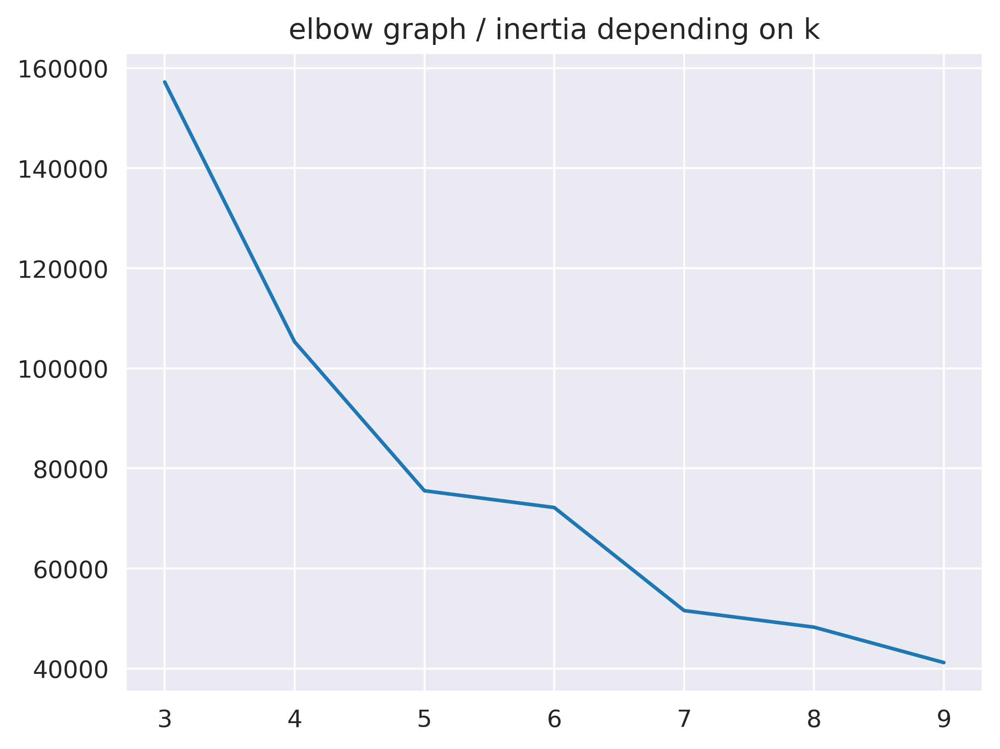

In [4]:
# Tìm số cụm tối ưu cho mô hình K-Mean bằng phương pháp Elbow
# sns.lineplot(range(3, 10), km_inertias) PHUOCNT
with sns.axes_style('darkgrid'):
    sns.lineplot(x=range(3, 10), y=km_inertias)

plt.title('elbow graph / inertia depending on k')
plt.show()

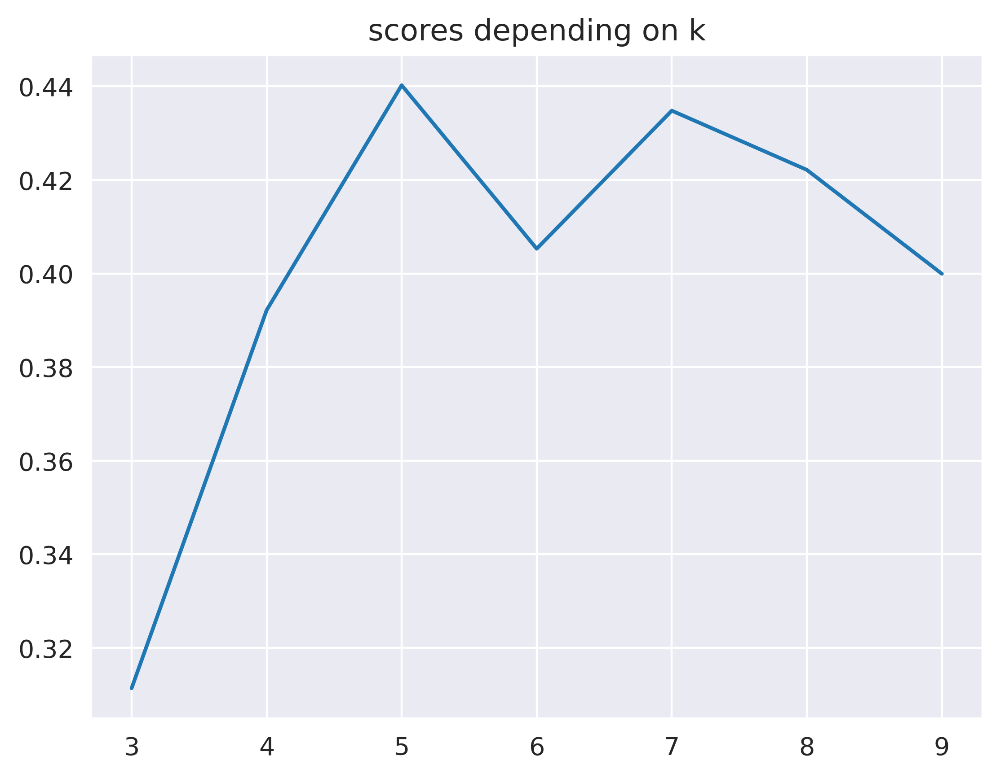

In [5]:
# Tìm số cụm tối ưu bằng phương pháp Silhoutte
with sns.axes_style('darkgrid'):
    sns.lineplot(x=range(3, 10), y=km_scores)
plt.title('scores depending on k')
plt.show()

In [6]:
# Gán nhãn cho các mẫu dữ liệu dựa vào mô hình K-Means với số cụm là 5

km = KMeans(n_clusters=5).fit(X)
#Assign the Cluster Labels to the Data
X['Label'] = km.labels_
#Info for each cluster
for k in range(5):
     print(f'Cluster nb : {k}')
     print(X[X.Label == k].describe().iloc[:, 1:-1])
     print('\n\n')

Cluster nb : 0
             Age  Annual Income (k$)  Spending Score (1-100)
count  37.000000           37.000000               37.000000
mean   40.324324           87.432432               18.189189
std    11.525465           16.272916               10.715611
min    19.000000           70.000000                1.000000
25%    34.000000           77.000000               10.000000
50%    41.000000           81.000000               16.000000
75%    47.000000           97.000000               26.000000
max    59.000000          137.000000               40.000000



Cluster nb : 1
             Age  Annual Income (k$)  Spending Score (1-100)
count  23.000000           23.000000               23.000000
mean   25.521739           26.304348               78.565217
std     5.273170            7.893811               10.953729
min    18.000000           15.000000               61.000000
25%    21.500000           19.500000               73.000000
50%    24.000000           25.000000               7

### Bài toán 2

#### Nhiệm vụ 1: Phân cụm dữ liệu trên tập dữ liệu iris-data

In [2]:
# Import thư viện và load dữ liệu
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

iris = pd.read_csv("Data/Iris.csv")
iris.drop('Id',inplace=True,axis=1)

X = iris.iloc[:,:-1].values #Set our training data
y = iris.iloc[:,-1].values #We'll use this just for visualization as clustering doesn't require labels

iris.head().style.background_gradient(cmap=sns.cubehelix_palette(as_cmap=True))

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,5.100000,3.500000,1.400000,0.200000,Iris-setosa
1,4.900000,3.000000,1.400000,0.200000,Iris-setosa
2,4.700000,3.200000,1.300000,0.200000,Iris-setosa
3,4.600000,3.100000,1.500000,0.200000,Iris-setosa
4,5.000000,3.600000,1.400000,0.200000,Iris-setosa


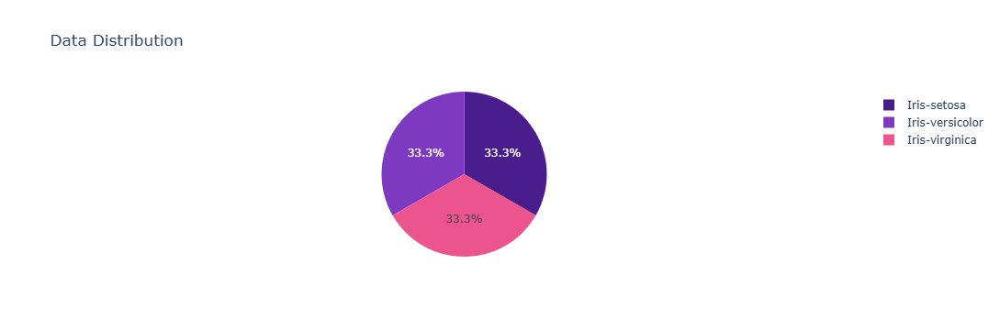

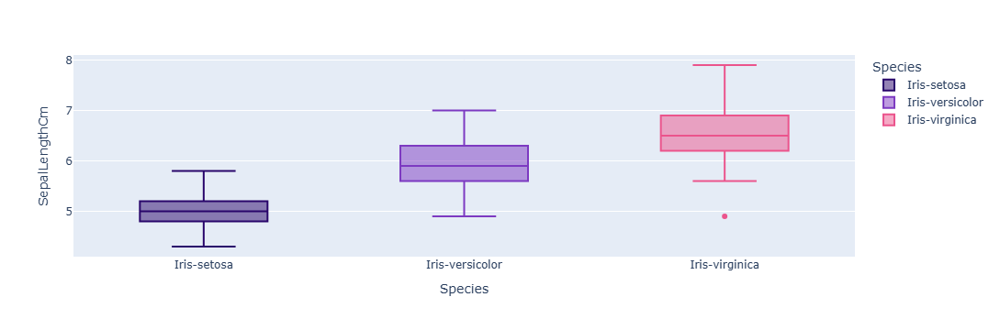

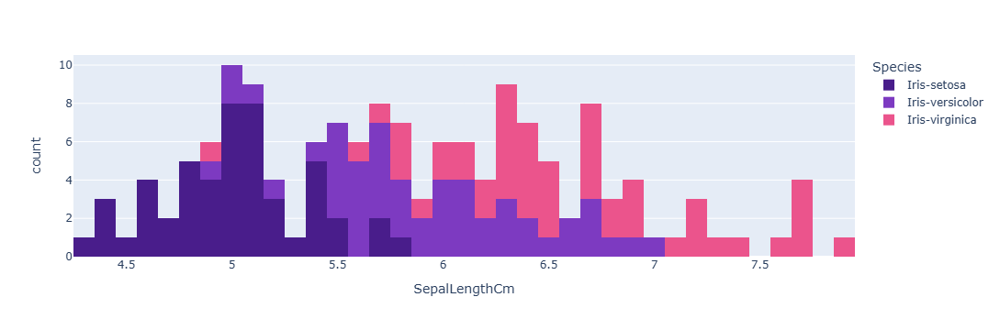

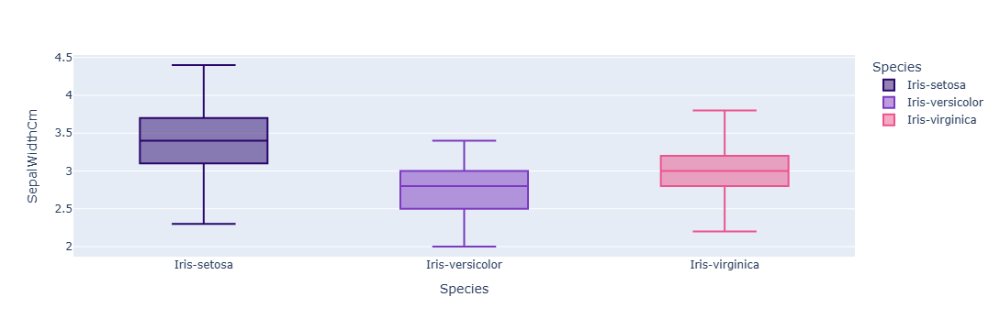

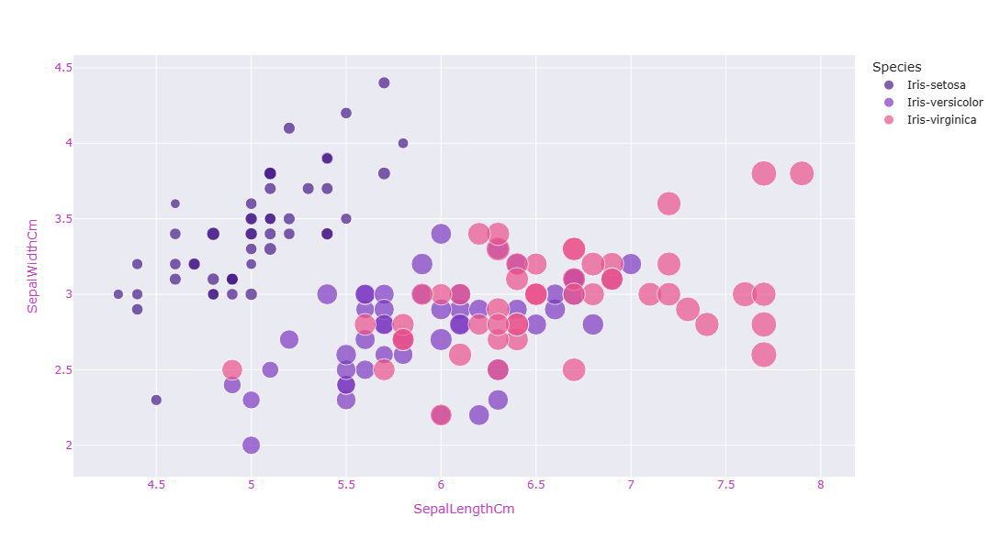

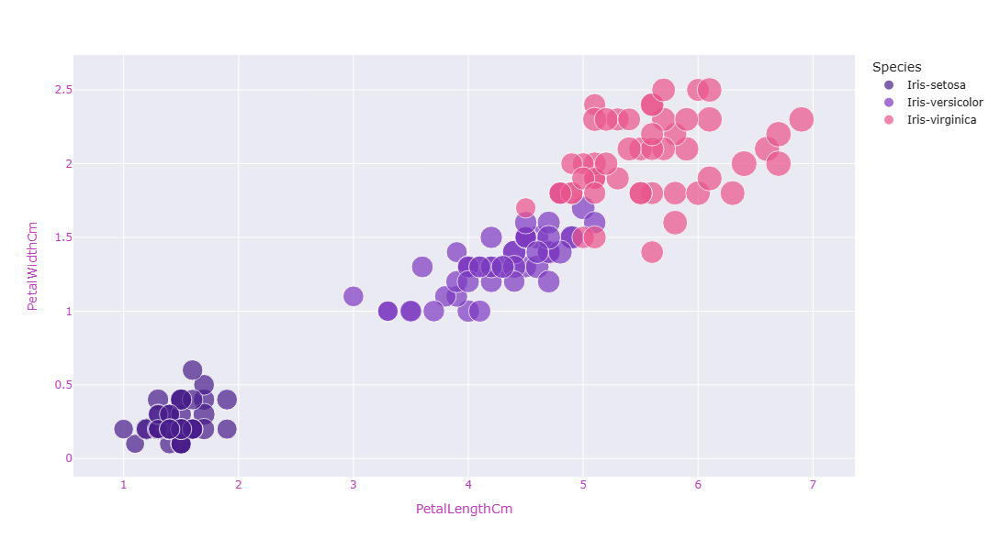

In [9]:
# EDA và xử lý dữ liệu
# Data Distribution => The Data is perfectly balanced
fig = px.pie(iris,'Species',color_discrete_sequence=['#491D8B','#7D3AC1','#EB548C'],
             title= 'Data Distribution',template='plotly')
fig.show()

# Phân tích biến Sepal-Length với box-plot
fig = px.box(data_frame=iris, x='Species',y='SepalLengthCm',
             color='Species', color_discrete_sequence=['#29066B','#7D3AC1','#EB548C'],
             orientation='v')
fig.show()

# Phân tích biến SepalLengthCm với histogram
fig = px.histogram(data_frame=iris, x='SepalLengthCm', color='Species', 
                   color_discrete_sequence=['#491D8B','#7D3AC1','#EB548C'], nbins=50)
fig.show()

# Phân tích biến SepalWidth với box plot
fig = px.box(data_frame=iris, x='Species', y='SepalWidthCm', color='Species',
             color_discrete_sequence=['#29066B','#7D3AC1','#EB548C'], orientation='v')
fig.show()

# Phân tích 2 biến SepalLengthCm và SepalWidthCm
fig = px.scatter(data_frame=iris, x='SepalLengthCm',y='SepalWidthCm', 
                 color='Species',size='PetalLengthCm', template='seaborn',
                 color_discrete_sequence=['#491D8B','#7D3AC1','#EB548C'],)

fig.update_layout(width=800, height=600, 
                  xaxis=dict(color="#BF40BF"), 
                  yaxis=dict(color="#BF40BF"))
fig.show()

# Phân tích 2 biến PetalLengthCm và PetalWidthCm
fig = px.scatter(data_frame=iris, x='PetalLengthCm',y='PetalWidthCm',
                 color='Species',size='SepalLengthCm', template='seaborn', 
                 color_discrete_sequence=['#491D8B','#7D3AC1','#EB548C'],)

fig.update_layout(width=800, height=600, 
                  xaxis=dict(color="#BF40BF"),
                  yaxis=dict(color="#BF40BF"))
fig.show()

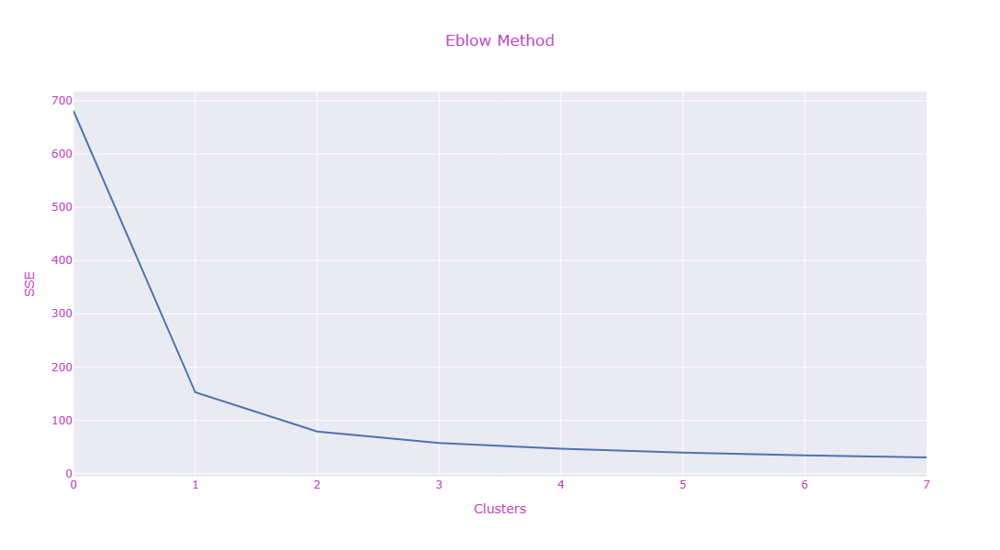

In [3]:
# Tìm số cluster tối ưu cho mô hình K-Means
sse = []
for i in range(1,9):
    kmeans = KMeans(n_clusters=i , max_iter=300) 
    kmeans.fit(X)
    sse.append(kmeans.inertia_)
    
fig = px.line(y=sse,template="seaborn",title='Eblow Method')
fig.update_layout(width=800, height=600,
title_font_color="#BF40BF", 
                  xaxis=dict(color="#BF40BF",title="Clusters"), 
                  yaxis=dict(color="#BF40BF",title="SSE"))
# Cluster = 3 là số cluster tối ưu cho dữ liệu Iris

In [4]:
# Xây dựng mô hình K-Means với số cluster tối ưu = 3 

means = KMeans(n_clusters = 3,
               init = 'k-means++',
               max_iter = 300, n_init = 10, random_state = 0)

clusters = means.fit_predict(X)

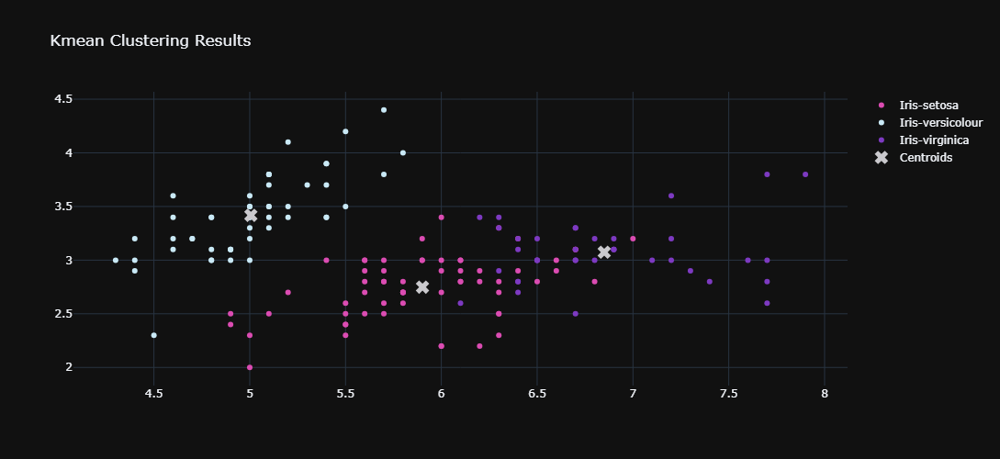

In [9]:
# Trình bày kết quả trực quan các cluster

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=X[clusters == 0, 0], y=X[clusters == 0, 1],
    mode='markers',marker_color='#DB4CB2',name='Iris-setosa'
))
fig.add_trace(go.Scatter(
    x=X[clusters == 1, 0], y=X[clusters == 1, 1],
    mode='markers',marker_color='#c9e9f6',name='Iris-versicolour'
))
fig.add_trace(go.Scatter(
    x=X[clusters == 2, 0], y=X[clusters == 2, 1],
    mode='markers',marker_color='#7D3AC1',name='Iris-virginica'
))
fig.add_trace(go.Scatter(
    x=means.cluster_centers_[:, 0], y= means.cluster_centers_[:,1],
    mode='markers',marker_color='#CAC9CD',marker_symbol=4, 
    marker_size=13,name='Centroids'
))

fig.update_layout(template='plotly_dark',width=1000, 
                  height=500,title='Kmean Clustering Results')

### Bài tập thực hành 1

In [52]:
# Import thư viện
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.ensemble import IsolationForest

# Đọc dữ liệu
df = pd.read_csv("Data/penguins.csv")
df = df.dropna()
X = df[["culmen_length_mm", "culmen_depth_mm", "flipper_length_mm", "body_mass_g"]].values

In [53]:
# Xử lý outliers dùng IsolationForest
iso = IsolationForest(contamination=0.02, random_state=42)
outlier_pred = iso.fit_predict(X)
X_clean = X[outlier_pred == 1]

In [54]:
# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_clean)

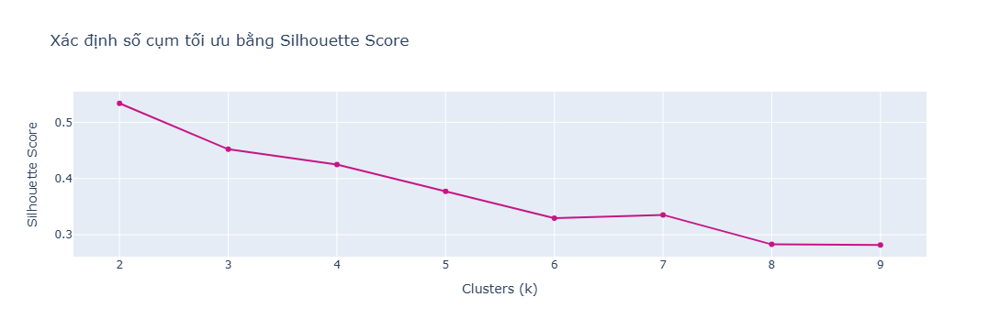

In [55]:
# Xác định số cụm tối ưu bằng Silhouette Score
silhouette_scores = []
K = range(2, 10)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    score = silhouette_score(X_scaled, kmeans.labels_)
    silhouette_scores.append(score)

fig = px.line(x=K, y=silhouette_scores, markers=True,
              title="Xác định số cụm tối ưu bằng Silhouette Score",
              labels={"x":"Clusters (k)", "y":"Silhouette Score"})
fig.update_traces(line_color="mediumvioletred")
fig.show()
# k=2 là số cụm tối ưu

In [56]:
# Xây dựng mô hình KMeans với k = 2
kmeans = KMeans(n_clusters=2, init='k-means++', max_iter=300, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

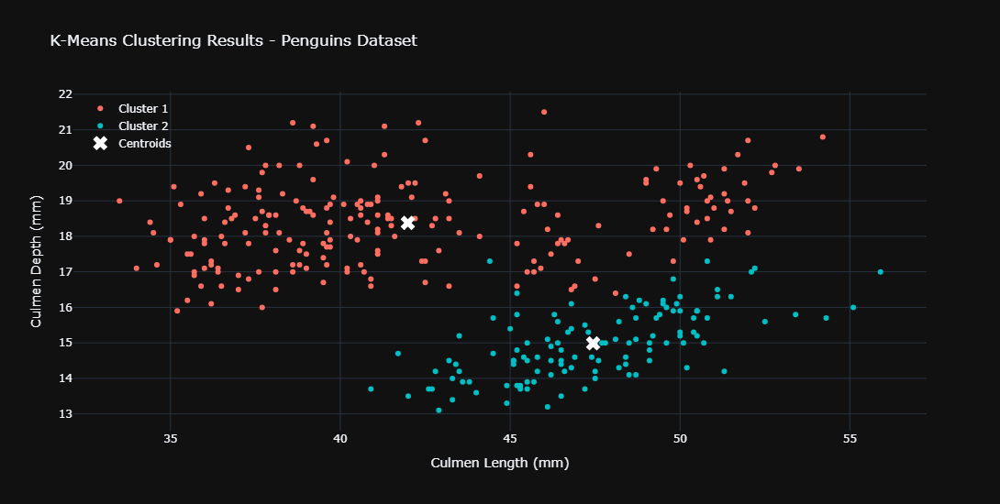

In [61]:
# Trực quan hóa kết quả
X = scaler.inverse_transform(X_scaled)
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=X[clusters == 0, 0], y=X[clusters == 0, 1],
    mode='markers', marker_color='#FF6F61',
    name='Cluster 1'
))
fig.add_trace(go.Scatter(
    x=X[clusters == 1, 0], y=X[clusters == 1, 1],
    mode='markers', marker_color='#00BFC4',
    name='Cluster 2'
))
# Centroids
fig.add_trace(go.Scatter(
    x=centroids_original[:, 0],
    y=centroids_original[:, 1],
    mode='markers',
    marker_color='#FFFFFF',
    marker_symbol=4,
    marker_size=14,
    name='Centroids'
))
# Layout
fig.update_layout(
    template='plotly_dark',
    width=1000,
    height=550,
    title='K-Means Clustering Results - Penguins Dataset',
    xaxis_title='Culmen Length (mm)',
    yaxis_title='Culmen Depth (mm)',
    legend=dict(x=0.01, y=0.99, bgcolor='rgba(0,0,0,0)')
)
fig.show()

### Bài tập thực hành 2 

In [61]:
# Import thư viện
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest
from sklearn.metrics import silhouette_score
import plotly.graph_objects as go
import plotly.express as px
import numpy as np

In [62]:
# Đọc dữ liệu và làm sạch
df = pd.read_csv("Data/OnlineRetail.csv", encoding='ISO-8859-1')
df = df[df['CustomerID'].notnull()]
df = df[(df['Quantity'] > 0) & (df['UnitPrice'] > 0)] # Loại dữ liệu âm 

In [63]:
# Gộp dữ liệu theo ID khách hàng
df_agg = df.groupby('CustomerID').apply(
    lambda x: pd.Series({
        'TotalQuantity': x['Quantity'].sum(),                                          # Tổng số lượng hàng hóa khách hàng mua
        'AvgUnitPrice': (x['Quantity'] * x['UnitPrice']).sum() / x['Quantity'].sum()   # Giá trung bình cho 1 đơn vị hàng hóa
    })
).reset_index()
num_customers = df_agg['CustomerID'].nunique()
print(f"Số lượng khách hàng riêng biệt sau khi gộp giao dịch theo ID: {num_customers}")

Số lượng khách hàng riêng biệt sau khi gộp giao dịch theo ID: 4338


In [64]:
# Xử lý outlier bằng IsolationForest
iso = IsolationForest(contamination=0.05, random_state=42)
outlier_pred = iso.fit_predict(df_agg[['TotalQuantity','AvgUnitPrice']])
df_clean = df_agg[outlier_pred == 1].reset_index(drop=True)

In [65]:
# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[['TotalQuantity','AvgUnitPrice']])

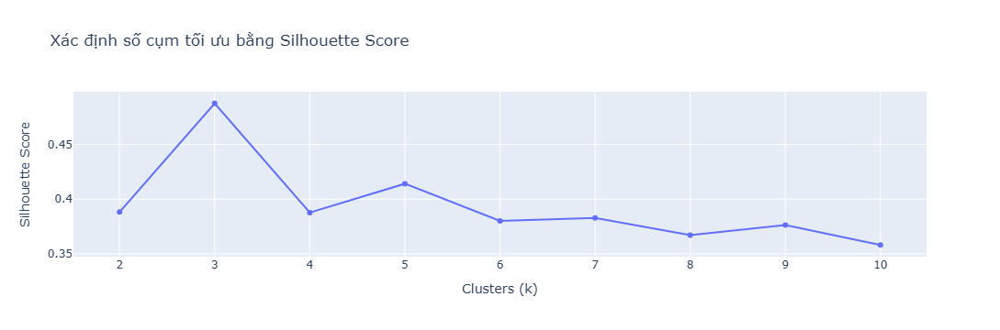

In [75]:
# Xác định k tối ưu bằng Silhouette
sil_scores = []
K_range = range(2, 11)
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42)
    labels = km.fit_predict(X_scaled)
    score = silhouette_score(X_scaled, labels)
    sil_scores.append(score)

# Vẽ đồ thị
fig_sil = px.line(
    x=list(K_range),
    y=sil_scores,
    markers=True,
    title='Xác định số cụm tối ưu bằng Silhouette Score',
    labels={'x':'Clusters (k)','y':'Silhouette Score'}
)
fig_sil.show()
# k=3 là số cụm tối ưu

In [76]:
# Xây dựng mô hình K-Means với k=3
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
df_clean['Cluster'] = kmeans.fit_predict(X_scaled)

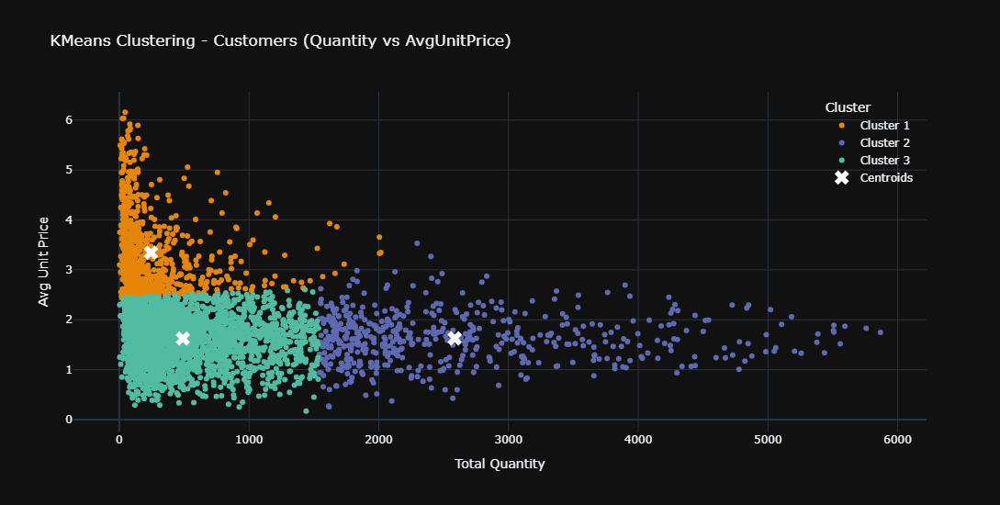

In [77]:
# Trực quan hóa kết quả phân cụm K-Means
fig = go.Figure()
colors = px.colors.qualitative.Vivid

for i in range(k):
    cluster_points = df_clean[df_clean['Cluster']==i]
    fig.add_trace(go.Scatter(
        x=cluster_points['TotalQuantity'],
        y=cluster_points['AvgUnitPrice'],
        mode='markers',
        marker_color=colors[i],
        name=f'Cluster {i+1}'
    ))

# Centroids
centroids_original = scaler.inverse_transform(kmeans.cluster_centers_)
fig.add_trace(go.Scatter(
    x=centroids_original[:,0],
    y=centroids_original[:,1],
    mode='markers',
    marker_color='#FFFFFF',
    marker_symbol=4,
    marker_size=14,
    name='Centroids'
))

fig.update_layout(
    template='plotly_dark',
    width=1000, height=550,
    title='KMeans Clustering - Customers (Quantity vs AvgUnitPrice)',
    xaxis_title='Total Quantity',
    yaxis_title='Avg Unit Price',
    legend=dict(title='Cluster', x=0.99, y=0.99, xanchor='right', yanchor='top', bgcolor='rgba(0,0,0,0)')
)

fig.show()

In [78]:
# Xem số lượng khách hàng mỗi cụm
# 0: cụm 1; 1: cụm 2; 2: cụm 3
print(df_clean['Cluster'].value_counts().sort_index())

Cluster
0     801
1     544
2    2776
Name: count, dtype: int64


In [79]:
# Xem trung bình tổng số lượng mua, và trung bình giá mua của các cụm
# 0: cụm 1; 1: cụm 2; 2: cụm 3
df_clean.groupby('Cluster')[['TotalQuantity','AvgUnitPrice']].mean()

,TotalQuantity,AvgUnitPrice
Cluster,,
0,244.127341,3.346465
1,2585.746324,1.626785
2,490.134366,1.625827


## 3.2. GIẢI THUẬT PHÂN CỤM ĐA CẤP

### Bài toán 1

#### Nhiệm vụ 1: Tìm hiểu một số khái niệm cơ bản của phân cụm đa cấp

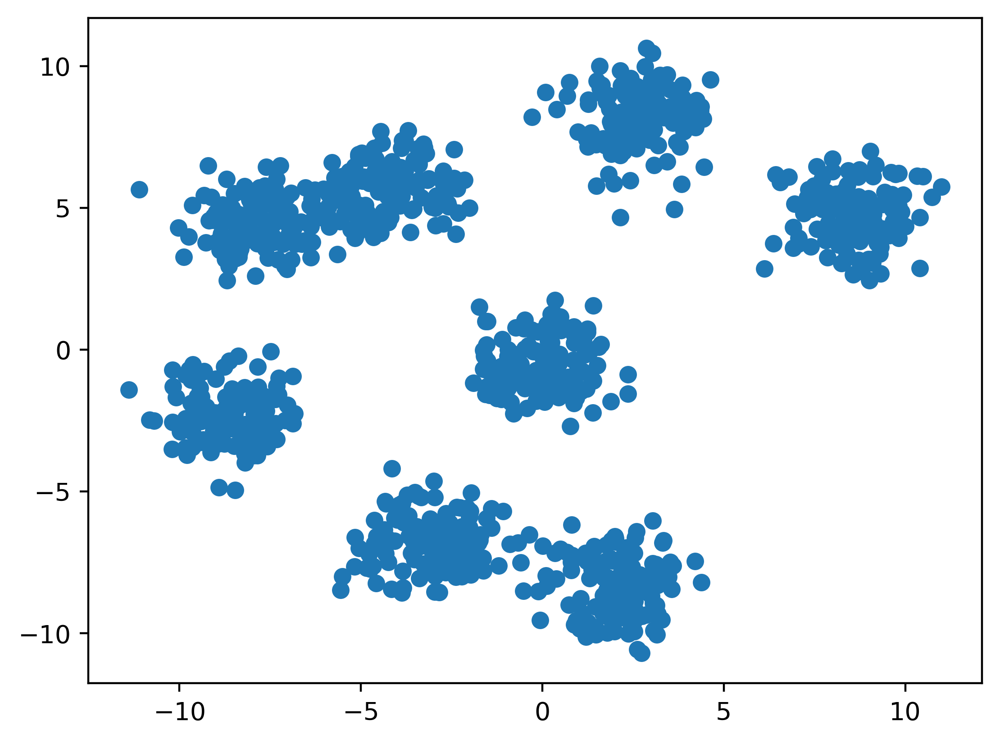

In [19]:
# Import thư viện, tạo dữ liệu giả (dummy data) và hiển thị dữ liệu
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
%matplotlib inline

# Generate a random cluster dataset to experiment on. X = coordinate points, y = cluster labels (not needed)
X, y = make_blobs(n_samples=1000, centers=8, n_features=2, random_state=800)

plt.scatter(X[:,0], X[:,1])
plt.show()

In [20]:
# Hiển thị ma trận khoảng cách giữa các điểm dữ liệu với điểm trung tâm
# Generate distance matrix with 'linkage' function
distances = linkage(X, method="centroid", metric="euclidean")
print(distances)

[[5.72000000e+02 7.62000000e+02 7.69412624e-03 2.00000000e+00]
 [3.00000000e+01 1.96000000e+02 8.87881891e-03 2.00000000e+00]
 [5.91000000e+02 8.70000000e+02 1.07476240e-02 2.00000000e+00]
 ...
 [1.98900000e+03 1.99200000e+03 7.81168528e+00 3.75000000e+02]
 [1.99500000e+03 1.99600000e+03 1.02408477e+01 7.50000000e+02]
 [1.99400000e+03 1.99700000e+03 1.20025814e+01 1.00000000e+03]]


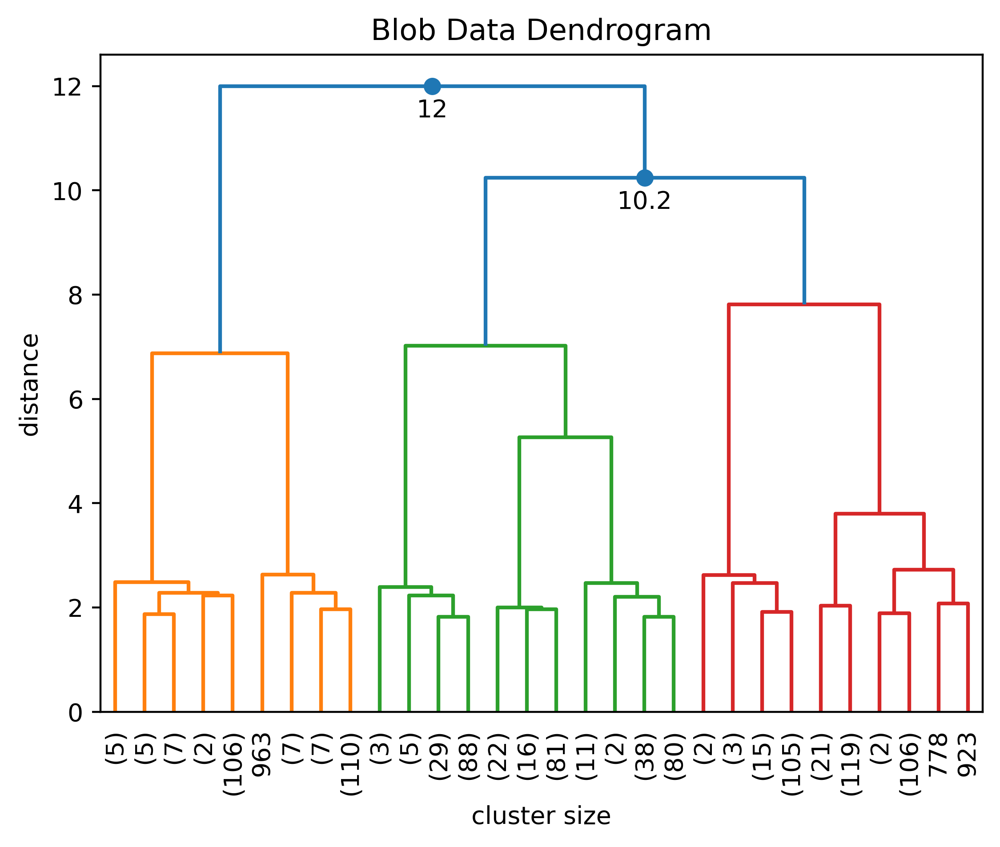

In [22]:
# Vẽ hình dendrogram từ ma trận khoảng cách

# Take normal dendrogram output and stylize in cleaner way
def annotated_dendrogram(*args, **kwargs): 
    # Standard dendrogram from SciPy
    scipy_dendro = dendrogram(*args, truncate_mode='lastp',
                              show_contracted=True,leaf_rotation=90.)
    plt.title('Blob Data Dendrogram')
    plt.xlabel('cluster size')
    plt.ylabel('distance')
    for i, d, c in zip(scipy_dendro['icoord'], scipy_dendro['dcoord'],
                       scipy_dendro['color_list']):
        x = 0.5 * sum(i[1:3])
        y = d[1]
        if y > 10:
            plt.plot(x, y, 'o', c=c)
            plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                         textcoords='offset points', va='top', ha='center')
    return scipy_dendro
dn = annotated_dendrogram(distances)
plt.show()

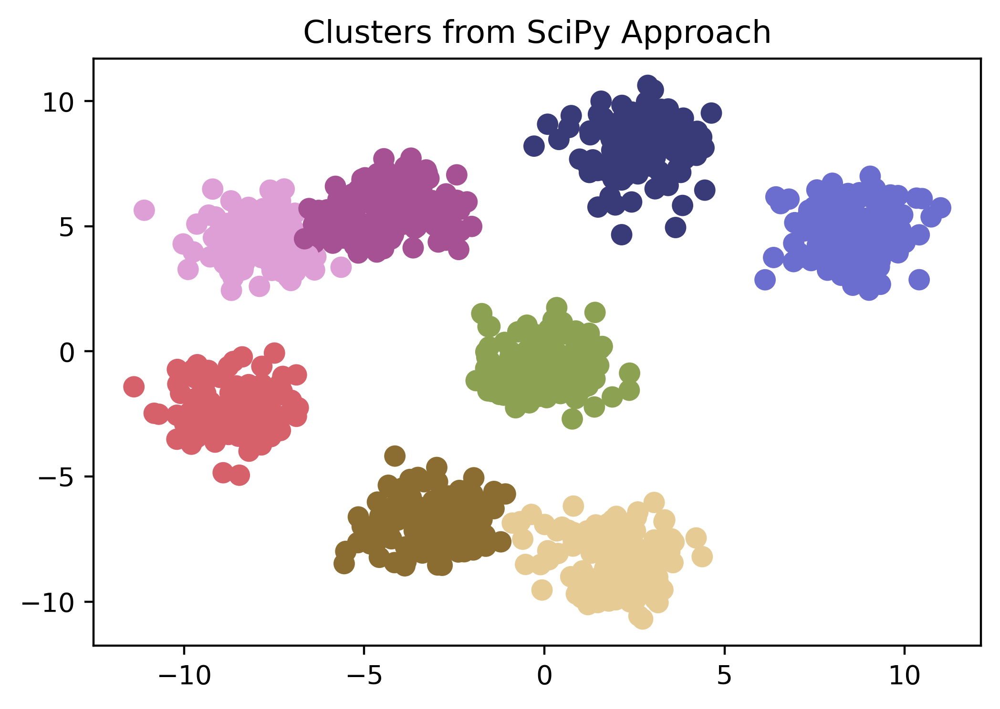

In [23]:
# Vẽ các cụm dữ liệu dựa ma trận khoảng cách và thông tin từ dendrogram với hàm fcluster
scipy_clusters = fcluster(distances, 3, criterion="distance")
plt.figure(figsize=(6,4))
plt.title("Clusters from SciPy Approach")
plt.scatter(X[:, 0], X[:, 1], c = scipy_clusters ,s=50, cmap='tab20b')
plt.show()

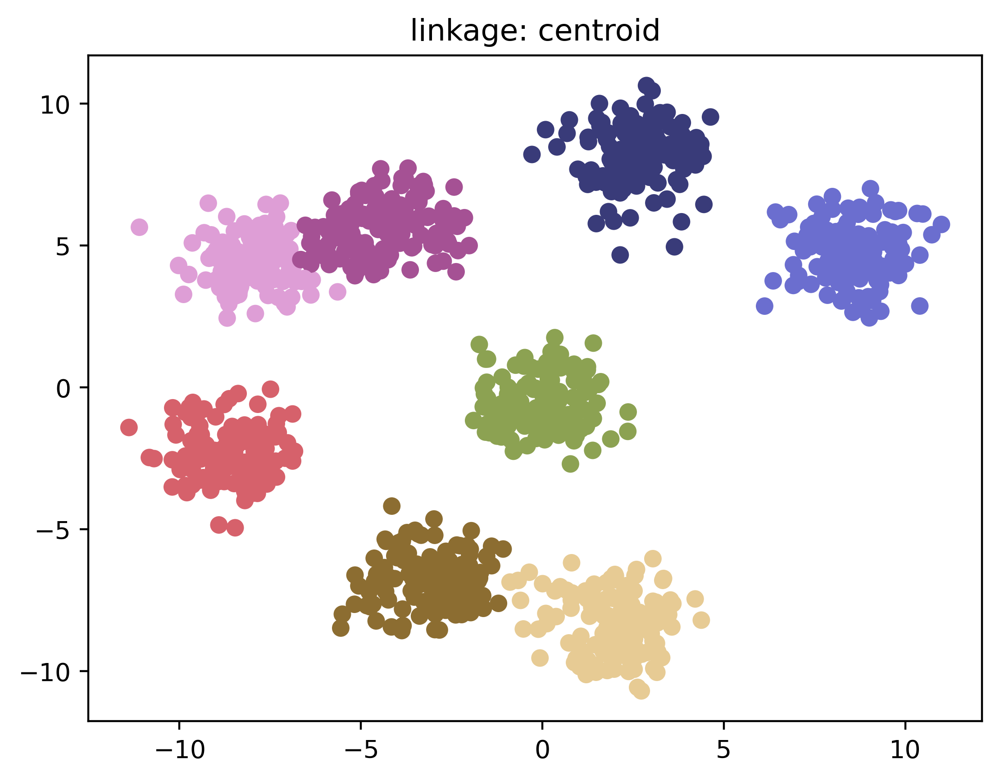

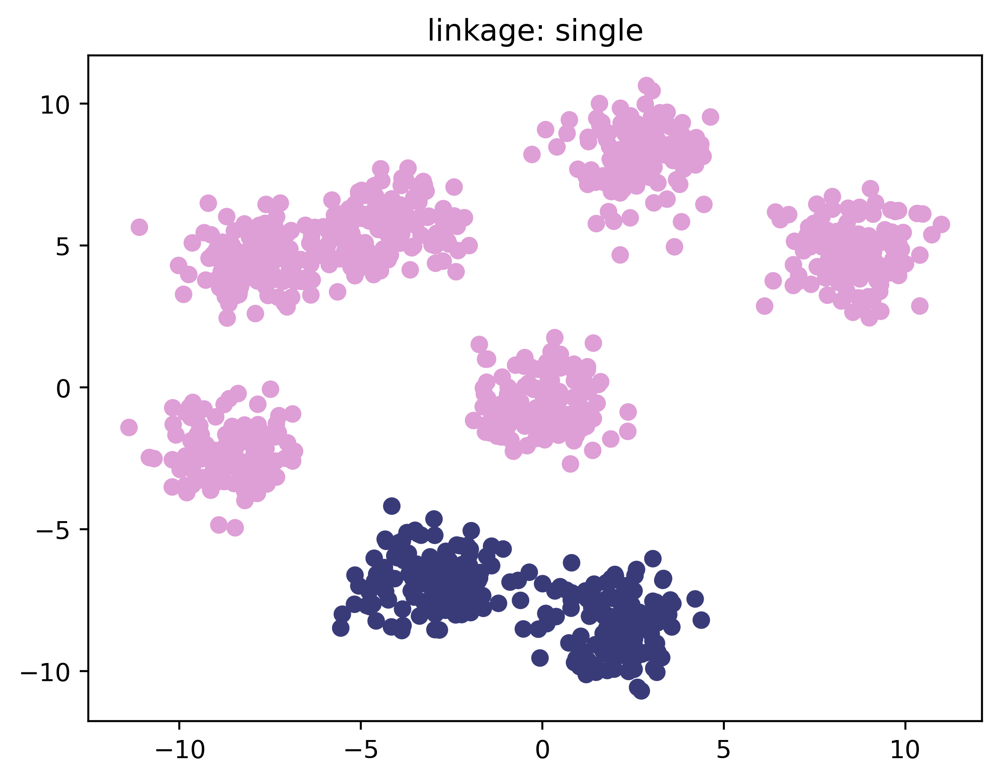

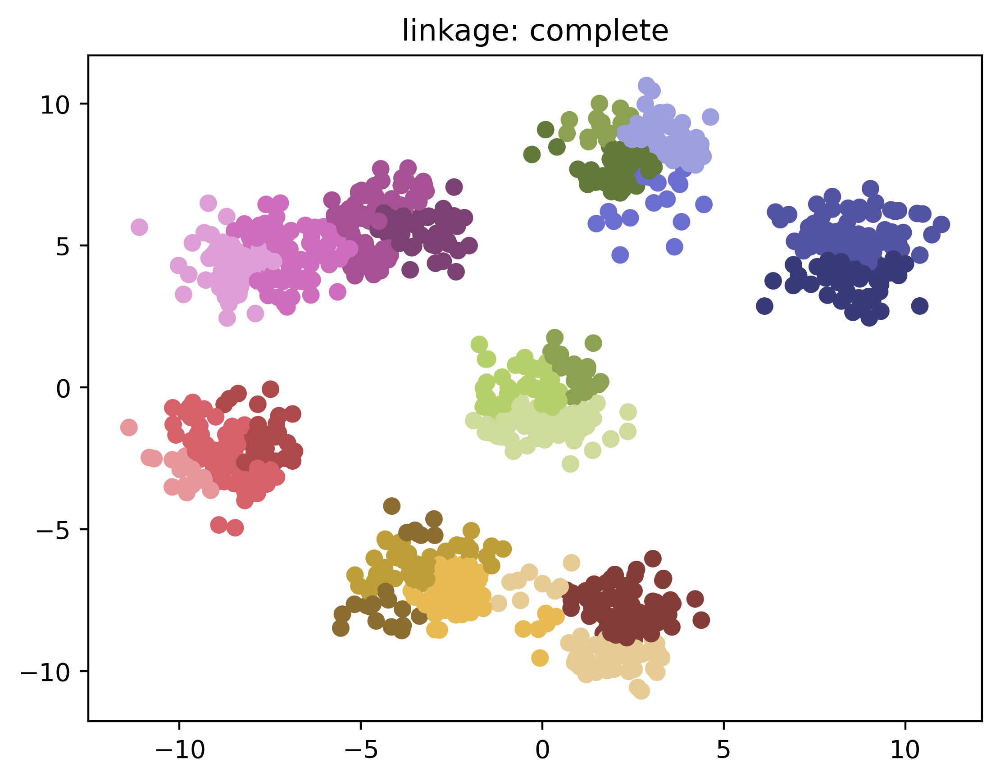

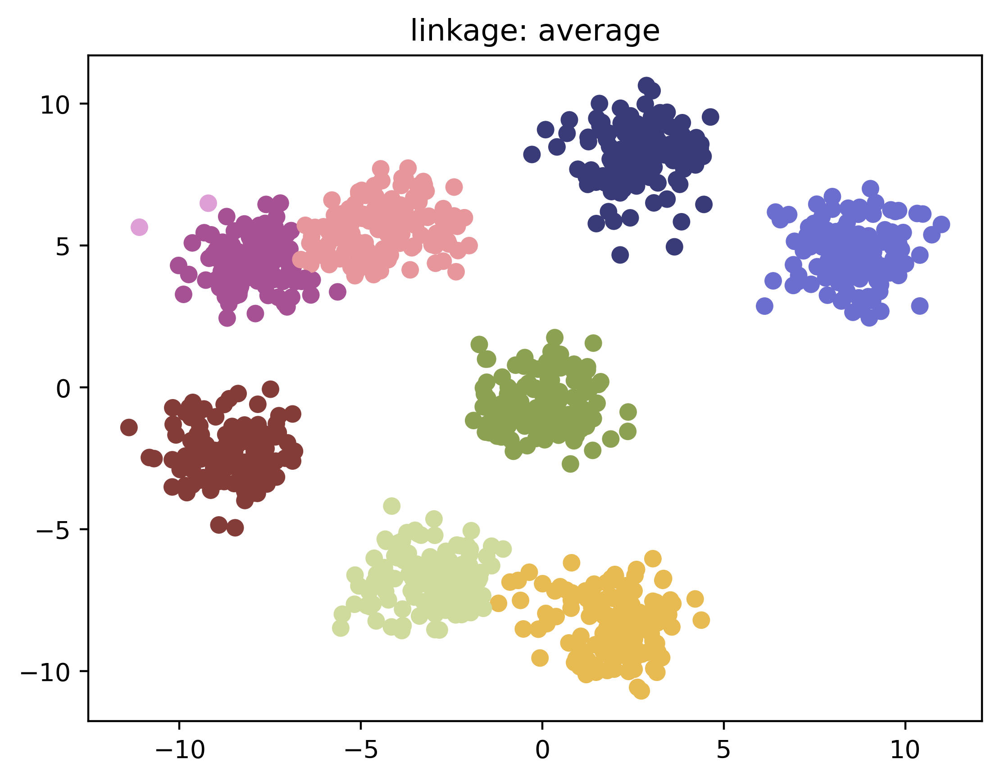

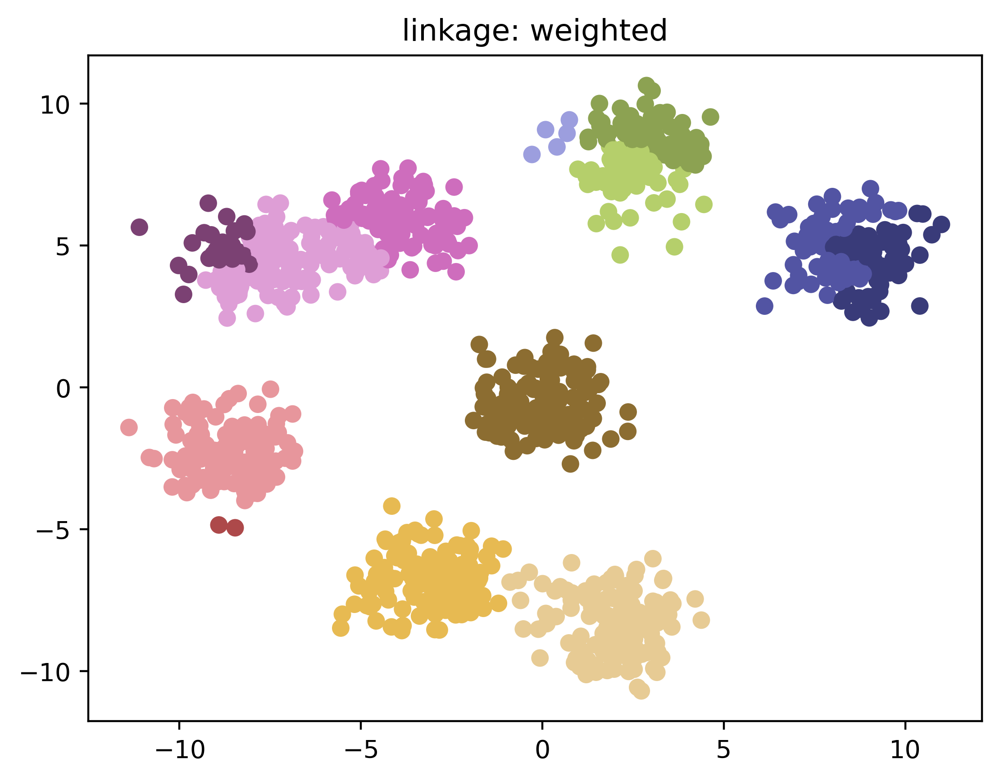

In [24]:
# Vẽ các cụm dữ liệu với các phương pháp linkage khác nhau
methods = ['centroid', 'single', 'complete', 'average', 'weighted']
for method in methods:
    distances = linkage(X, method=method, metric="euclidean")
    clusters = fcluster(distances, 3, criterion="distance")
    plt.title('linkage: ' + method)
    plt.scatter(X[:,0], X[:,1], c=clusters, cmap='tab20b')
    plt.show()

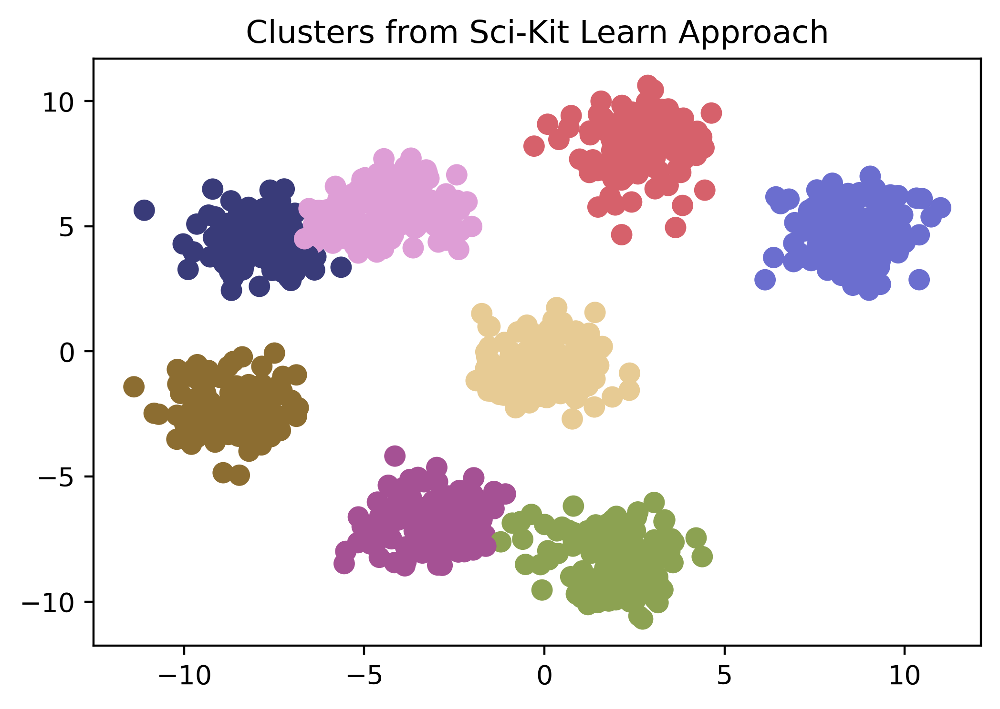

In [26]:
# Xây dựng mô hình phân cụm đa cấp theo tiếp cận của thư viện scikit-learn

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

ac = AgglomerativeClustering(n_clusters = 8, linkage="average")

#distances = linkage(X, method="centroid", metric="euclidean")
sklearn_clusters = ac.fit_predict(X)
scipy_clusters = fcluster(distances, 3, criterion="distance")
plt.figure(figsize=(6,4))
plt.title("Clusters from Sci-Kit Learn Approach")
plt.scatter(X[:, 0], X[:, 1], c = sklearn_clusters ,s=50, cmap='tab20b')
plt.show()

### Bài toán 2

In [27]:
# Import & tải dữ liệu rượu vang lên notebook
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import pandas as pd
import matplotlib.pyplot as plt
wine_df = pd.read_csv("Data/wine-clustering.csv")

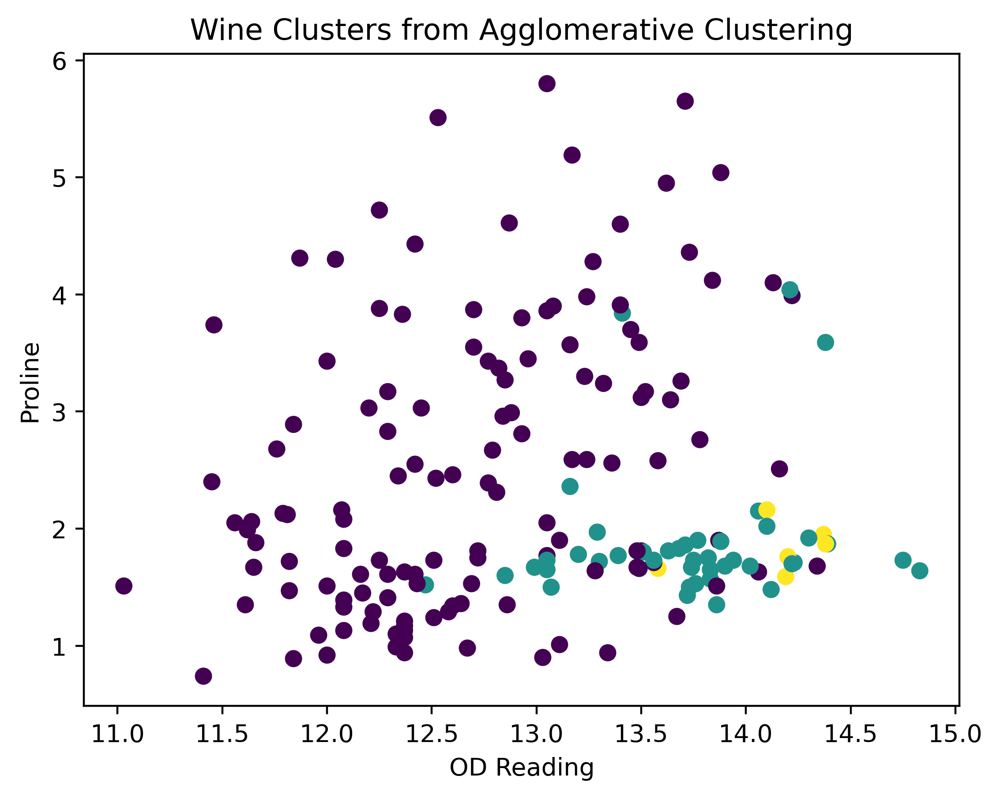

In [37]:
# Xây dựng mô hình phân cụm đa cấp theo cách tiếp cận scikit-learn và hiển thị kết quả phân cụm trên dữ liệu
ac = AgglomerativeClustering(3, linkage='average')
ac_clusters = ac.fit_predict(wine_df)
# Hiển thị các cụm sau khi phân cấp theo cách tiếp cận của scikit-learn
plt.scatter(wine_df.values[:,0], wine_df.values[:,1], c=ac_clusters)
plt.title("Wine Clusters from Agglomerative Clustering")
plt.xlabel("OD Reading")
plt.ylabel("Proline")
plt.show()

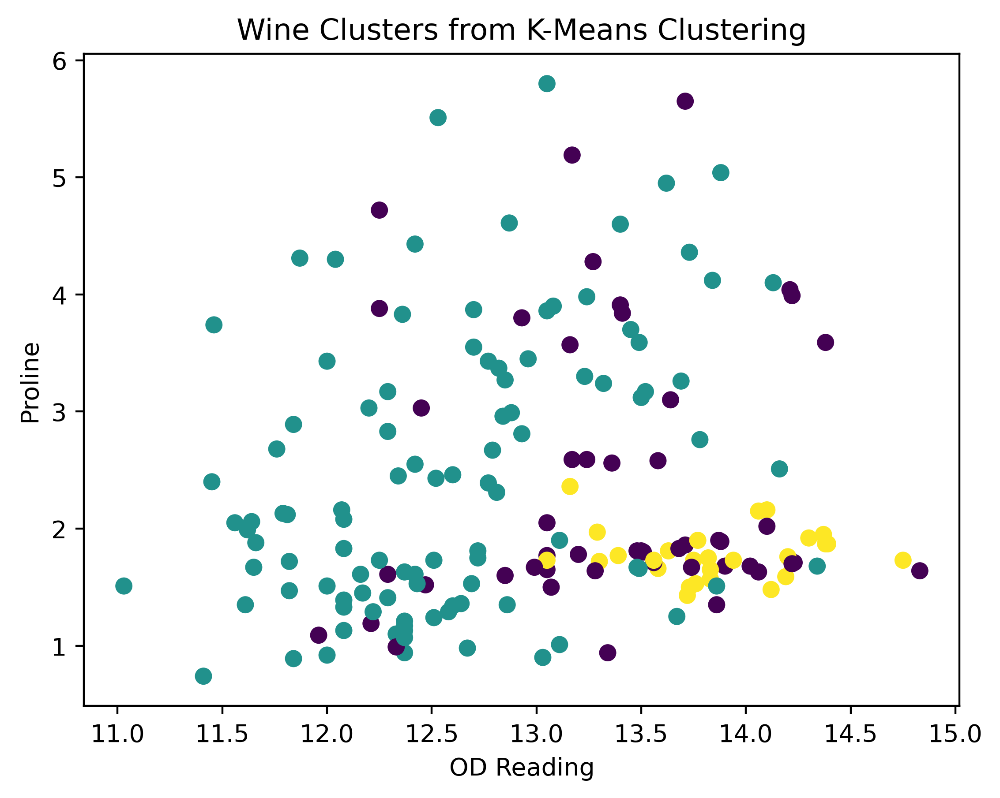

In [39]:
# Phân cụm sử dụng K-Means và so sánh với kết quả phân cụm đa cấp
km = KMeans(3)
km_clusters = km.fit_predict(wine_df)
# Hiển thị kết quả sau khi phân cụm K-mean
plt.scatter(wine_df.values[:,0], wine_df.values[:,1], c=km_clusters)
plt.title("Wine Clusters from K-Means Clustering")
plt.xlabel("OD Reading")
plt.ylabel("Proline")
plt.show()

In [40]:
# So sánh kết quả phân cụm của 2 mô hình với phương pháp tính Silhouette
# Calculate Silhouette Scores
print("Silhouette Scores for Wine Dataset:\n")
print("K-Means Clustering: ", silhouette_score(wine_df, km_clusters))
print("Agg Clustering: ", silhouette_score(wine_df, ac_clusters))

Silhouette Scores for Wine Dataset:

K-Means Clustering:  0.5595823478987215
Agg Clustering:  0.6100753288756409


### Bài tập thục hành 1

In [41]:
# Import thư viện
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.ensemble import IsolationForest
import plotly.graph_objects as go
from scipy.cluster.hierarchy import linkage, dendrogram
import matplotlib.pyplot as plt

In [44]:
# Đọc dữ liệu và loại biến NA
df = pd.read_csv("Data/penguins.csv")
features = ['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm', 'body_mass_g']
df = df.dropna(subset=features)

In [45]:
# Xử lý outlier bằng IsolationForest
iso = IsolationForest(contamination=0.02, random_state=42)
outlier_pred = iso.fit_predict(df[features])
df_clean = df[outlier_pred == 1].reset_index(drop=True)

In [46]:
# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[features])

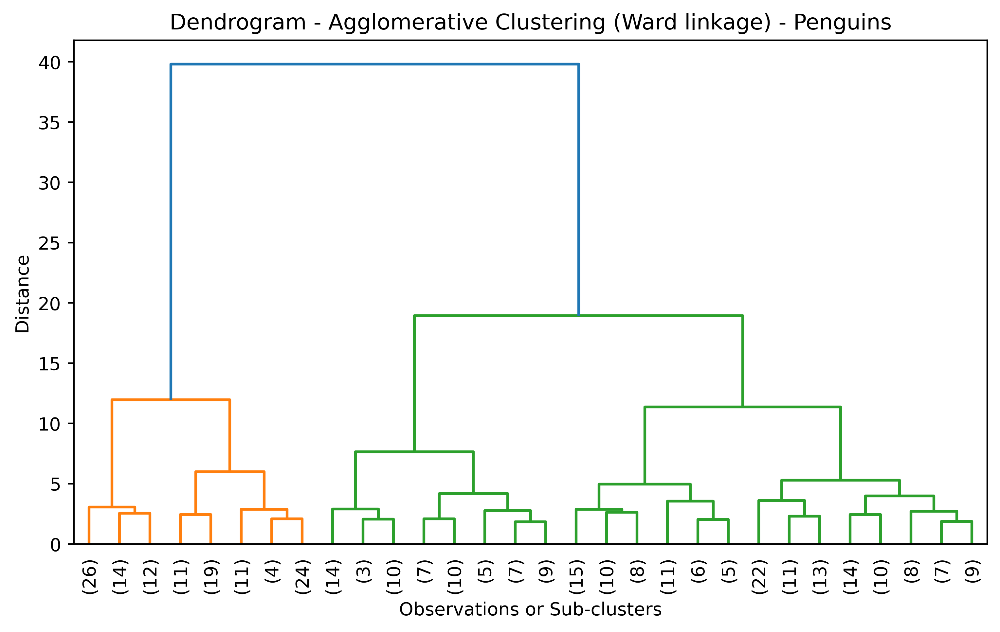

In [49]:
# Vẽ đồ thị Dendrogram để quan sát số cụm hợp lý
Z = linkage(X_scaled, method='ward') # Phương pháp liên kết Ward
plt.figure(figsize=(9, 5))
dendrogram(Z, truncate_mode='lastp', p=30, leaf_rotation=90., leaf_font_size=10.)
plt.title("Dendrogram - Agglomerative Clustering (Ward linkage) - Penguins")
plt.xlabel("Observations or Sub-clusters")
plt.ylabel("Distance")
plt.show()
# Dựa trên Dendrogram,ta sẽ chọn số cụm là 2

In [50]:
# Xây dựng mô hình phân cụm đa cấp Agglomerative
agg = AgglomerativeClustering(n_clusters=2, linkage='ward')
clusters = agg.fit_predict(X_scaled)
df_clean['Cluster'] = clusters

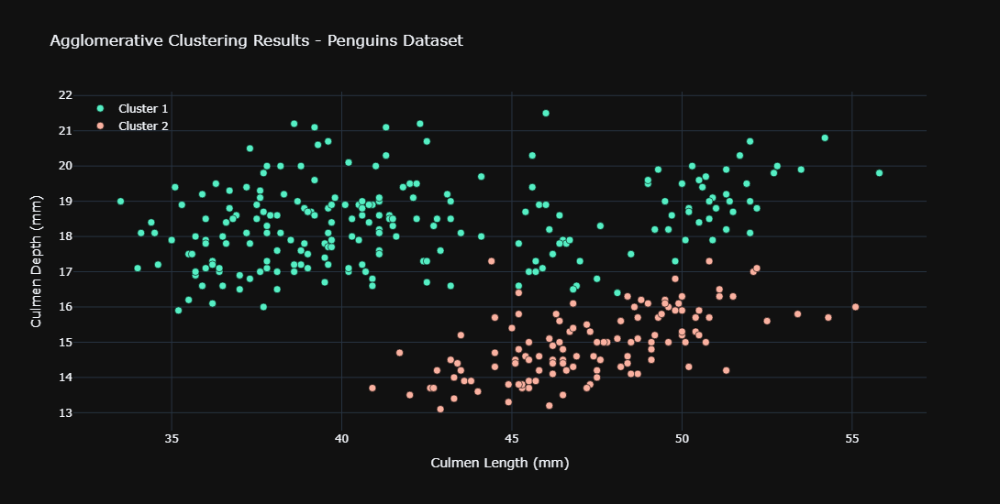

In [60]:
# Trực quan hóa kết quả
fig = go.Figure()

colors = ['#55efc4', '#fab1a0']
for i, color in enumerate(colors):
    fig.add_trace(go.Scatter(
        x=df_clean.loc[df_clean['Cluster'] == i, 'culmen_length_mm'],
        y=df_clean.loc[df_clean['Cluster'] == i, 'culmen_depth_mm'],
        mode='markers',
        marker=dict(size=8, color=color, line=dict(width=0.6, color='black')),
        name=f'Cluster {i+1}'
    ))
fig.update_layout(
    template='plotly_dark',
    width=950,
    height=550,
    title='Agglomerative Clustering Results - Penguins Dataset',
    xaxis_title='Culmen Length (mm)',
    yaxis_title='Culmen Depth (mm)',
    legend=dict(x=0.01, y=0.99, bgcolor='rgba(0,0,0,0)')
)
fig.show()

### Bài tập thực hành 2

In [72]:
# Import thư viện
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np

In [67]:
# Đọc dữ liệu và làm sạch
df = pd.read_csv("Data/OnlineRetail.csv", encoding='ISO-8859-1')
df = df[df['CustomerID'].notnull()]
df = df[(df['Quantity'] > 0) & (df['UnitPrice'] > 0)] # Loại dữ liệu âm 

In [68]:
# Gộp dữ liệu theo ID khách hàng
df_agg = df.groupby('CustomerID').apply(
    lambda x: pd.Series({
        'TotalQuantity': x['Quantity'].sum(),                                          # Tổng số lượng hàng hóa khách hàng mua
        'AvgUnitPrice': (x['Quantity'] * x['UnitPrice']).sum() / x['Quantity'].sum()   # Giá trung bình cho 1 đơn vị hàng hóa
    })
).reset_index()
num_customers = df_agg['CustomerID'].nunique()
print(f"Số lượng khách hàng riêng biệt sau khi gộp giao dịch theo ID: {num_customers}")

Số lượng khách hàng riêng biệt sau khi gộp giao dịch theo ID: 4338


In [69]:
# Xử lý outlier bằng IsolationForest
iso = IsolationForest(contamination=0.05, random_state=42)
outlier_pred = iso.fit_predict(df_agg[['TotalQuantity','AvgUnitPrice']])
df_clean = df_agg[outlier_pred == 1].reset_index(drop=True)

In [70]:
# Chuẩn hóa dữ liệu
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[['TotalQuantity','AvgUnitPrice']])

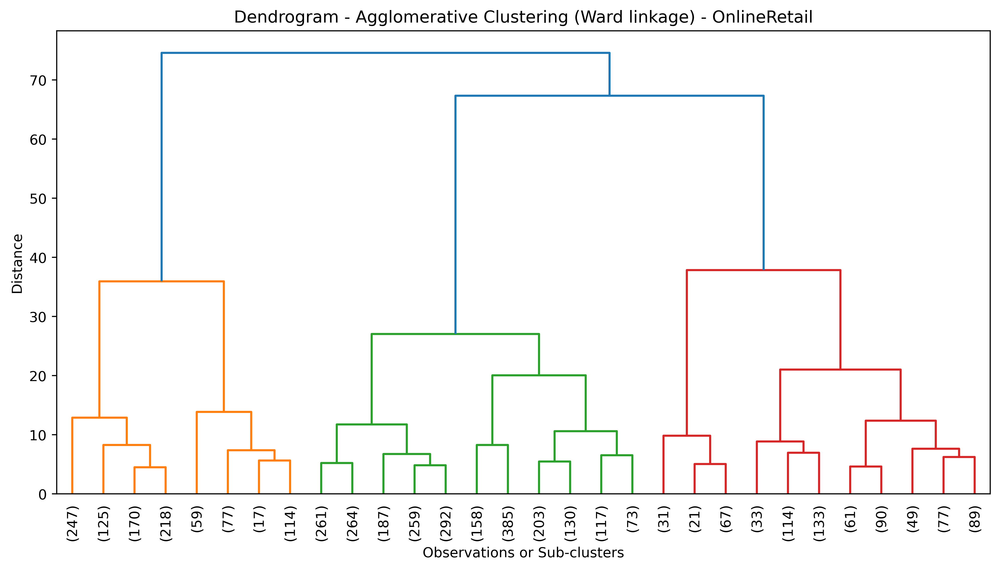

In [86]:
# Vẽ đồ thị Dendrogram để quan sát số cụm hợp lý
Z = linkage(X_scaled, method='ward')  # Phương pháp liên kết Ward

plt.figure(figsize=(12, 6))
plt.title("Dendrogram - Agglomerative Clustering (Ward linkage) - OnlineRetail")
plt.xlabel("Observations or Sub-clusters")
plt.ylabel("Distance")
dendrogram(Z, truncate_mode='lastp', p=30, leaf_rotation=90., leaf_font_size=10.)
plt.show()

In [87]:
# Xây dựng mô hình phân cụm đa cấp Agglomerative
hc = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
labels = hc.fit_predict(X_scaled)
df_clean['Cluster'] = labels

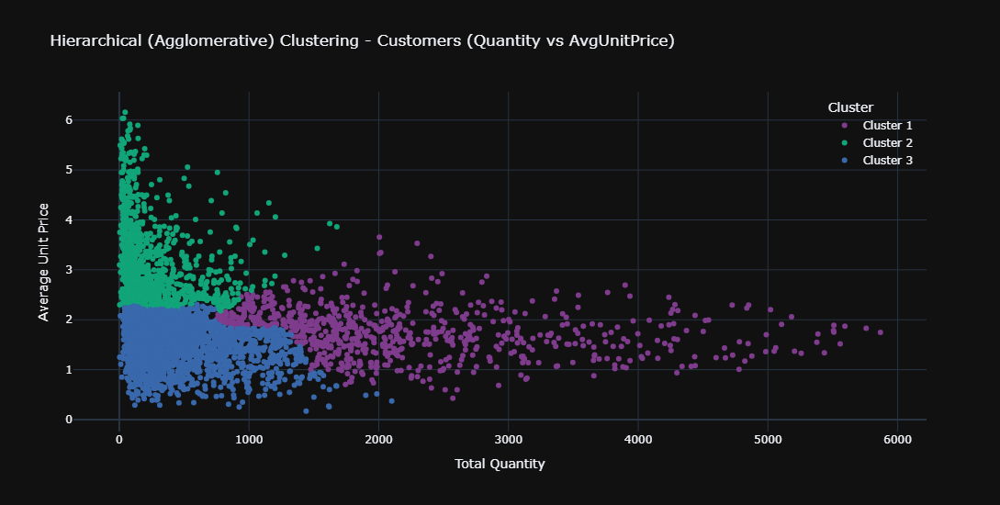

In [109]:
# Trực quan hóa kết quả
plt.close()
fig = go.Figure()
colors = px.colors.qualitative.Bold

for i in range(3):
    cluster_points = df_clean[df_clean['Cluster'] == i]
    fig.add_trace(go.Scatter(
        x=cluster_points['TotalQuantity'],
        y=cluster_points['AvgUnitPrice'],
        mode='markers',
        marker_color=colors[i],
        name=f'Cluster {i+1}'
    ))

fig.update_layout(
    template='plotly_dark',
    width=1000, height=550,
    title='Hierarchical (Agglomerative) Clustering - Customers (Quantity vs AvgUnitPrice)',
    xaxis_title='Total Quantity',
    yaxis_title='Average Unit Price',
    legend=dict(title='Cluster', x=0.99, y=0.99, xanchor='right', yanchor='top', bgcolor='rgba(0,0,0,0)'
    )
)
fig.show()

In [110]:
# Xem số lượng khách hàng mỗi cụm
# 0: cụm 1; 1: cụm 2; 2: cụm 3
print(df_clean['Cluster'].value_counts().sort_index())

Cluster
0     765
1    1027
2    2329
Name: count, dtype: int64


In [111]:
# Xem trung bình tổng số lượng mua, và trung bình giá mua của các cụm
# 0: cụm 1; 1: cụm 2; 2: cụm 3
df_clean.groupby('Cluster')[['TotalQuantity','AvgUnitPrice']].mean()

,TotalQuantity,AvgUnitPrice
Cluster,,
0,2179.249673,1.767314
1,251.561831,3.121388
2,445.395019,1.511861


# KẾT THÚC LAB 03